# Data Handling and CSV Creating

In [248]:
import glob
import re
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd
from pywt import wavedec
import pywt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix

In [2]:
# Dataset Classes:
# ________________

# Yukari-->Up
# Asagi-->Down
# Sag-->Right 
# Sol-->Left
# Kirp-->Blink 
# Center ????
# what h and v reprenets ??? 


In [3]:
# Define the class labels
class_labels = {
    'yukari': 1,
    'asagi': 2,
    'sag': 3,
    'sol': 4,
    'kirp': 5
}

In [4]:
 h=[]
classes=class_labels.keys()

In [5]:
classes

dict_keys(['yukari', 'asagi', 'sag', 'sol', 'kirp'])

In [7]:
 with open('data handling.csv', 'a') as csv_file:
        for filename in glob.glob('3-class/*.txt'):
            # Get the class label from the filename

            print(filename)
            h = filename.split('\\')[-1].split('.')[0]
            print(h)
            matches = re.split(r'(\d+)', h)
            print(matches[0])
            if matches[0] in classes:
                with open(filename, 'r') as file:
                    # Read the contents of the file and split it into lines
                    lines = file.read()
                lines=lines.replace('\n',',')
                for line in lines:
                    csv_file.write(line)
                label = class_labels[matches[0]]
                csv_file.write(str(label)+'\n')
                

3-class\asagi10h.txt
asagi10h
3-class\asagi10v.txt
asagi10v
3-class\asagi11h.txt
asagi11h
3-class\asagi11v.txt
asagi11v
3-class\asagi12h.txt
asagi12h
3-class\asagi12v.txt
asagi12v
3-class\asagi13h.txt
asagi13h
3-class\asagi13v.txt
asagi13v
3-class\asagi14h.txt
asagi14h
3-class\asagi14v.txt
asagi14v
3-class\asagi15h.txt
asagi15h
3-class\asagi15v.txt
asagi15v
3-class\asagi16h.txt
asagi16h
3-class\asagi16v.txt
asagi16v
3-class\asagi17h.txt
asagi17h
3-class\asagi17v.txt
asagi17v
3-class\asagi18h.txt
asagi18h
3-class\asagi18v.txt
asagi18v
3-class\asagi19h.txt
asagi19h
3-class\asagi19v.txt
asagi19v
3-class\asagi1h.txt
asagi1h
3-class\asagi1v.txt
asagi1v
3-class\asagi20h.txt
asagi20h
3-class\asagi20v.txt
asagi20v
3-class\asagi2h.txt
asagi2h
3-class\asagi2v.txt
asagi2v
3-class\asagi3h.txt
asagi3h
3-class\asagi3v.txt
asagi3v
3-class\asagi4h.txt
asagi4h
3-class\asagi4v.txt
asagi4v
3-class\asagi5h.txt
asagi5h
3-class\asagi5v.txt
asagi5v
3-class\asagi6h.txt
asagi6h
3-class\asagi6v.txt
asagi6v
3-cl

In [6]:
names= np.arange(0,252)

In [10]:
df = pd.read_csv('data handling.csv', names=names)

In [11]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,242,243,244,245,246,247,248,249,250,251
0,123,126,134,131,125,131,130,127,133,128,...,143,139,143,141,139,138,142,136,137,2
1,123,122,127,130,123,123,127,128,125,125,...,134,133,130,136,135,130,139,136,129,2
2,127,135,130,135,129,127,133,131,130,132,...,143,140,139,144,142,139,139,143,134,2
3,120,132,120,127,126,125,120,125,122,118,...,128,137,131,124,133,129,124,131,130,2
4,133,137,134,132,137,136,135,136,136,130,...,143,141,148,148,144,149,147,150,150,2


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 201 entries, 0 to 200
Columns: 252 entries, 0 to 251
dtypes: int64(252)
memory usage: 395.8 KB


# Sample

In [23]:
x = np.array(df.iloc[1:2 , :-1])

In [24]:
x = x.squeeze()

In [25]:
timee = np.arange(0,len(x))

# Visualition 

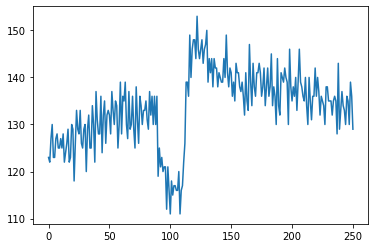

In [26]:
plt.plot(timee , x)

In [27]:
x2 = np.array(df.iloc[2:3 , :-1])

In [28]:
x2 = x2.squeeze()

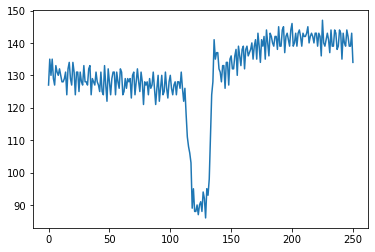

In [29]:
plt.plot(timee , x2)

In [30]:
y1 = np.array(df.iloc[3:4 , :-1])

In [31]:
y1 = y1.squeeze()

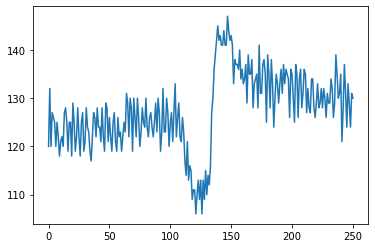

In [32]:
plt.plot(timee , y1) # -------> down 

In [33]:
y2 = np.array(df.iloc[4:5 , :-1])

In [34]:
y2 = y2.squeeze()

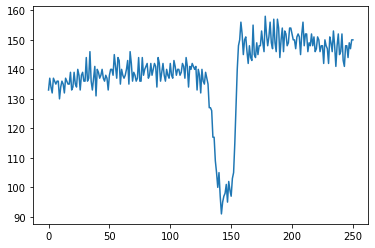

In [35]:
plt.plot(timee , y2)

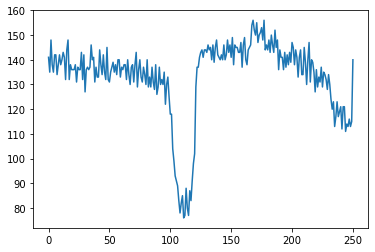

In [36]:
z1 = np.array(df.iloc[134:135 ,:-1])
z1 = z1.squeeze()
plt.plot(timee , z1)

In [37]:
df[134:135]

,0,1,2,3,4,5,6,7,8,9,...,242,243,244,245,246,247,248,249,250,251
134,141,135,148,138,135,142,142,134,138,142,...,121,121,111,114,113,116,113,115,140,4


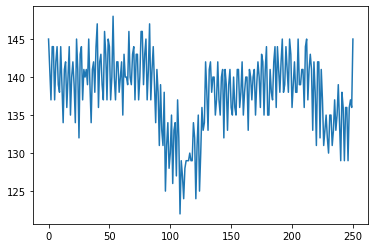

In [38]:
z1 = np.array(df.iloc[135:136 ,:-1])
z1 = z1.squeeze()
plt.plot(timee , z1) #--------- > Left 

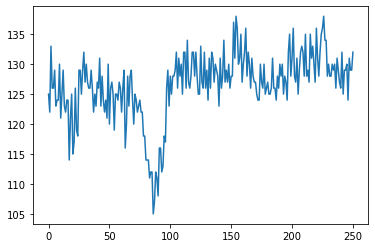

In [39]:
z1 = np.array(df.iloc[176:177 ,:-1])
z1 = z1.squeeze()
plt.plot(timee , z1)

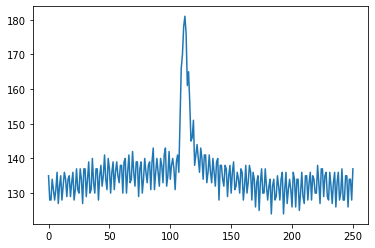

In [40]:
blinkh = np.array(df.iloc[40:41 ,:-1])
blinkh = blinkh.squeeze()
plt.plot(timee , blinkh)

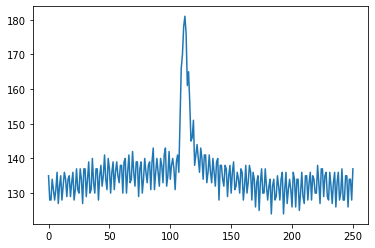

In [41]:
blinkv = np.array(df.iloc[41:42 ,:-1])
blinkv = blinkh.squeeze()
plt.plot(timee , blinkv)

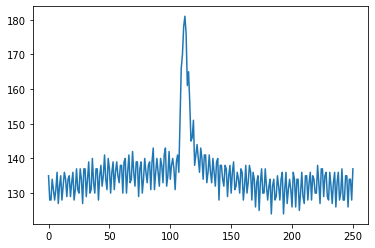

In [45]:
blinkv = np.array(df.iloc[47:48 ,:-1])
blinkv = blinkh.squeeze()
plt.plot(timee , blinkv)

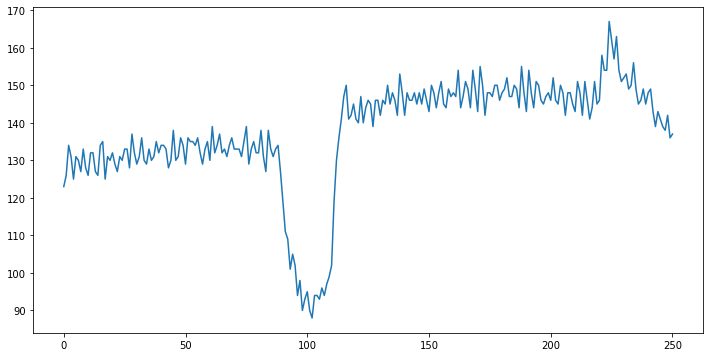

In [55]:
plt.figure(figsize=(12,6))
h = np.array(df.iloc[0:1 ,:-1])
h = h.squeeze()
plt.plot(timee , h)

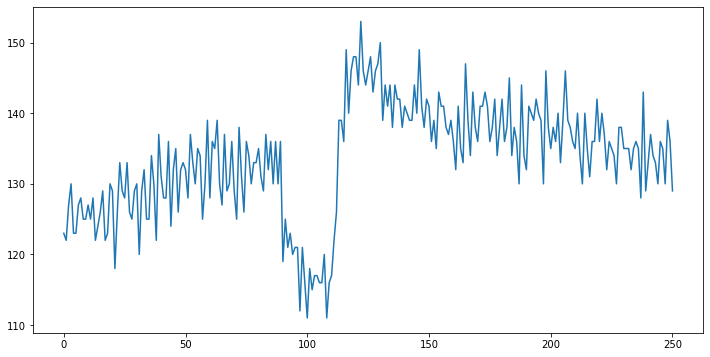

In [57]:
plt.figure(figsize=(12,6))
v = np.array(df.iloc[1:2 ,:-1])
v = v.squeeze()
plt.plot(timee , v)

In [49]:
df[0:1]

,0,1,2,3,4,5,6,7,8,9,...,242,243,244,245,246,247,248,249,250,251
0,123,126,134,131,125,131,130,127,133,128,...,143,139,143,141,139,138,142,136,137,2


In [50]:
df[1:2]

,0,1,2,3,4,5,6,7,8,9,...,242,243,244,245,246,247,248,249,250,251
1,123,122,127,130,123,123,127,128,125,125,...,134,133,130,136,135,130,139,136,129,2


# Preprocessing

In [51]:
x=df.iloc[:,:-1]

In [52]:
x

,0,1,2,3,4,5,6,7,8,9,...,241,242,243,244,245,246,247,248,249,250
0,123,126,134,131,125,131,130,127,133,128,...,149,143,139,143,141,139,138,142,136,137
1,123,122,127,130,123,123,127,128,125,125,...,137,134,133,130,136,135,130,139,136,129
2,127,135,130,135,129,127,133,131,130,132,...,135,143,140,139,144,142,139,139,143,134
3,120,132,120,127,126,125,120,125,122,118,...,121,128,137,131,124,133,129,124,131,130
4,133,137,134,132,137,136,135,136,136,130,...,152,143,141,148,148,144,149,147,150,150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,126,131,129,130,130,131,130,129,131,126,...,143,140,139,142,148,140,139,143,146,124
197,146,145,144,147,143,143,146,142,142,147,...,125,135,131,129,128,132,132,126,133,153
198,127,119,125,125,126,126,121,127,129,121,...,135,139,145,144,140,141,140,136,142,133
199,147,141,140,140,145,137,145,141,142,140,...,143,133,142,138,141,138,145,138,142,144


In [53]:
y=df.iloc[:,-1:]

In [54]:
y

,251
0,2
1,2
2,2
3,2
4,2
...,...
196,1
197,1
198,1
199,1


Text(0, 0.5, "'Amp(v)")

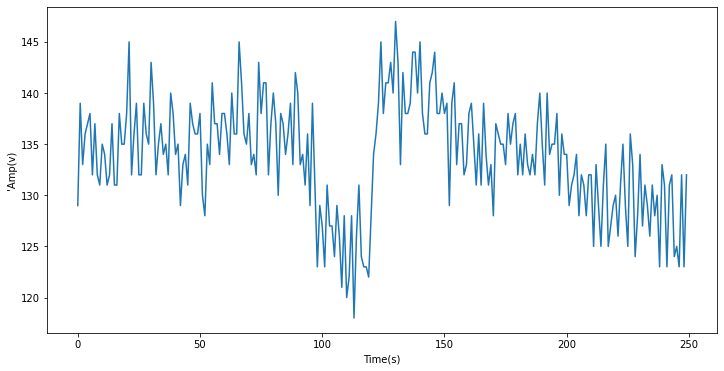

In [65]:
from scipy import signal
from scipy.signal import butter, filtfilt
EOG_signal= open('3-class/asagi1v.txt', 'r')
lines=EOG_signal.readlines()
lines
Amp=[]
for i in range (len(lines)-1):
    L=lines[i+1]
    Amp. append (int(L))
plt.figure(figsize=(12,6))
plt.plot(np.arange(0,len(Amp)),Amp)
plt.xlabel("Time(s)")
plt.ylabel("'Amp(v)")

Text(0, 0.5, "'Amp(v)")

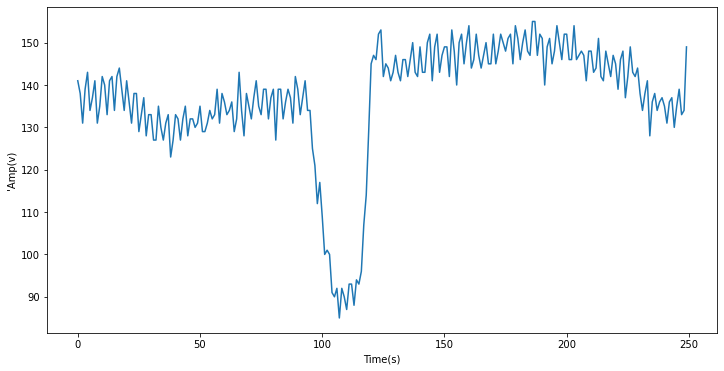

In [66]:
EOG_signal= open('3-class/asagi1h.txt', 'r')
lines=EOG_signal.readlines()
lines
Amp=[]
for i in range (len(lines)-1):
    L=lines[i+1]
    Amp. append (int(L))
plt.figure(figsize=(12,6))
plt.plot(np.arange(0,len(Amp)),Amp)
plt.xlabel("Time(s)")
plt.ylabel("'Amp(v)")

# butter bandpass filter

In [85]:
def butter_bandpass_filter(Input_Signal, Low_Cutoff, High_Cutoff,Sampling_Rate, order):
    nyq = 0.5*Sampling_Rate
    low=Low_Cutoff/nyq
    high =High_Cutoff/nyq
    Numerator, denominator = butter(order,[low,high],btype='band', output='ba',analog=False, fs=None)
    filtered = filtfilt(Numerator,denominator,Input_Signal)
    return filtered

In [86]:
filtered_signal = butter_bandpass_filter(x,Low_Cutoff=0.5,High_Cutoff=20.0,Sampling_Rate=176,order=2)

201

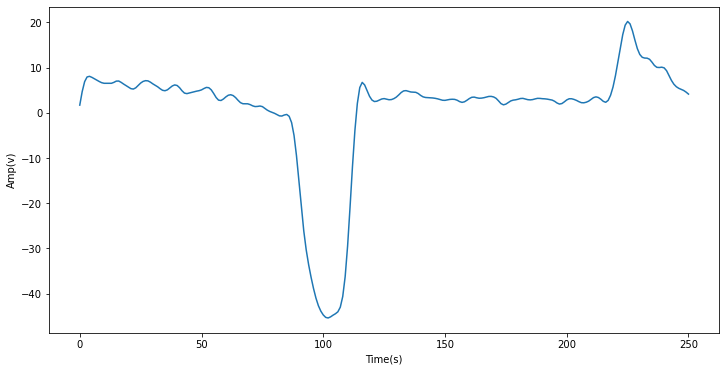

In [91]:
# tryyyy
filtered_signal1 = butter_bandpass_filter(x.iloc[0:1,:],Low_Cutoff=0.5,High_Cutoff=20.0,Sampling_Rate=176,order=2)
filtered_signal1=filtered_signal1.squeeze()
plt.figure(figsize=(12,6))
plt.plot(np.arange(0,len(filtered_signal1)),filtered_signal1)
plt.xlabel("Time(s)")
plt.ylabel("Amp(v)")


In [95]:
check=filtered_signal[0]==filtered_signal1

In [96]:
check.all()
#tryyy ends here

True

In [87]:
filtered_signal

array([[ 1.71229893,  4.70888388,  6.9062191 , ...,  4.96196793,
         4.60029223,  4.15300954],
       [-1.84670798, -0.67729491,  0.23935683, ...,  5.709014  ,
         4.04771053,  1.46349227],
       [-0.70705532,  1.63389694,  3.20611144, ...,  8.85912147,
         6.71859707,  3.89721349],
       ...,
       [-2.18200309, -3.73754496, -4.68991724, ...,  6.13909747,
         3.93349455,  1.2260316 ],
       [-1.42979101, -4.18832849, -6.19208848, ..., -3.82978398,
        -2.90532899, -1.71296992],
       [-2.66266875, -3.62072658, -4.40462094, ..., 17.93893174,
        13.99866854,  8.63157659]])

C:\Users\EGYPT\AppData\Local\Temp/ipykernel_19100/3049312574.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,6))


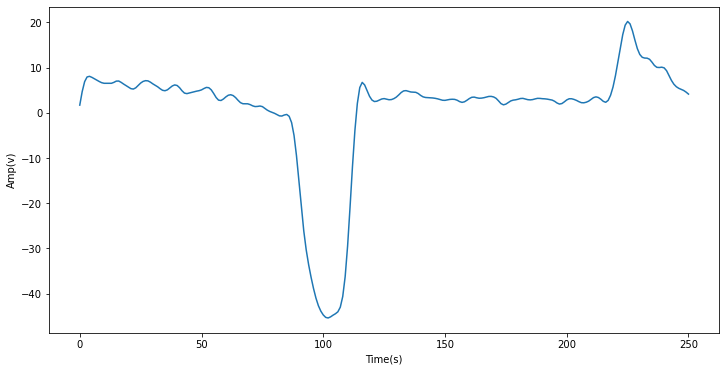

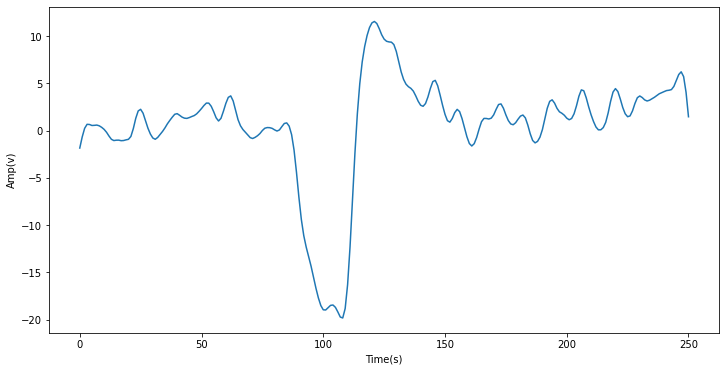

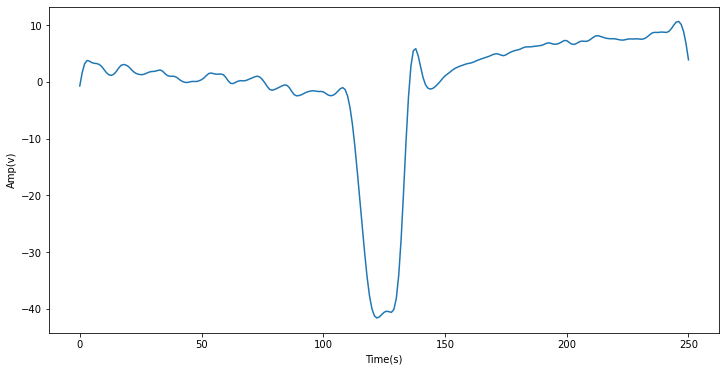

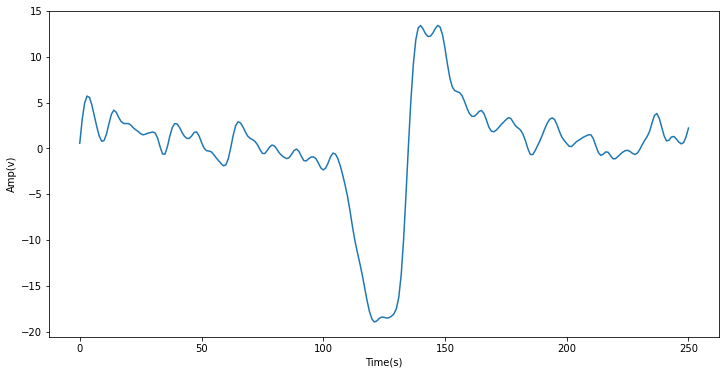

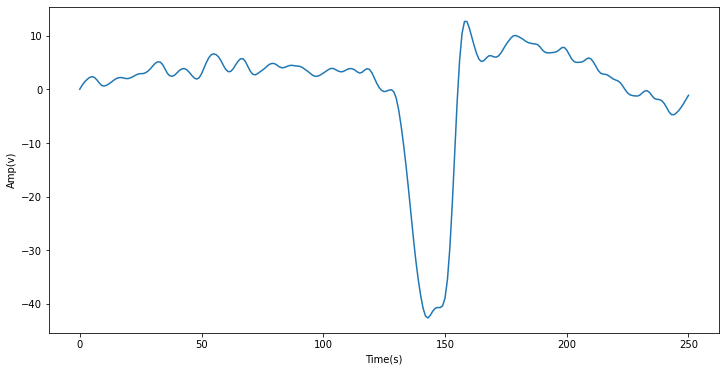

...

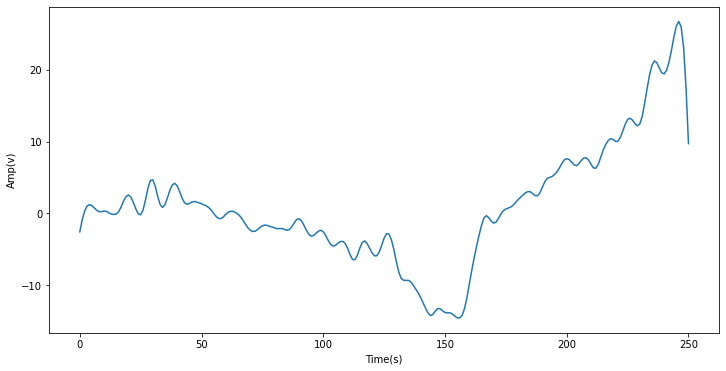

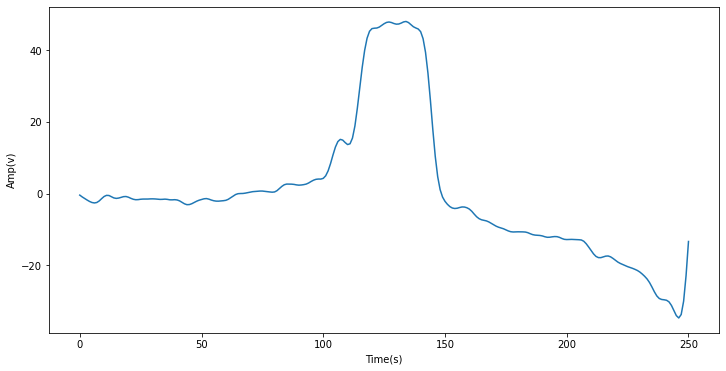

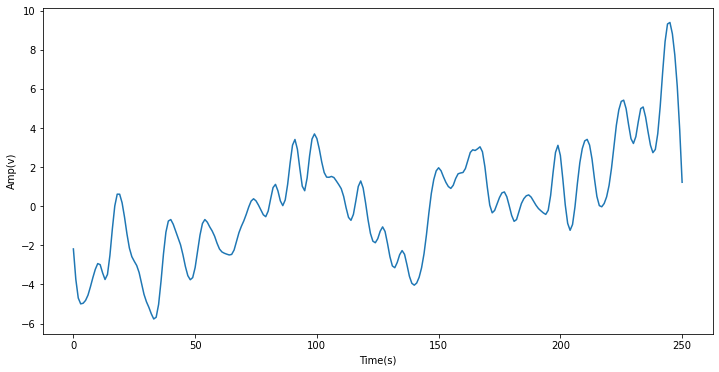

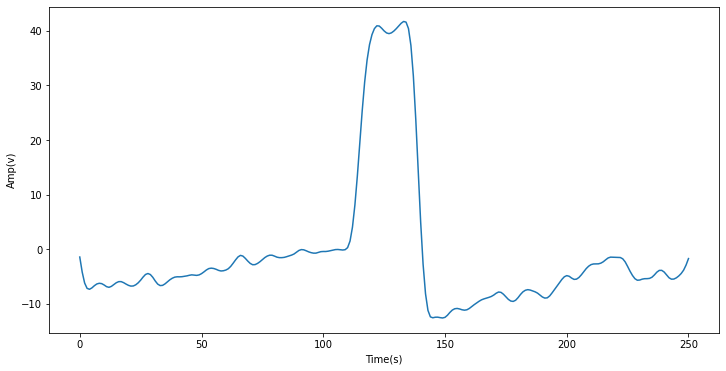

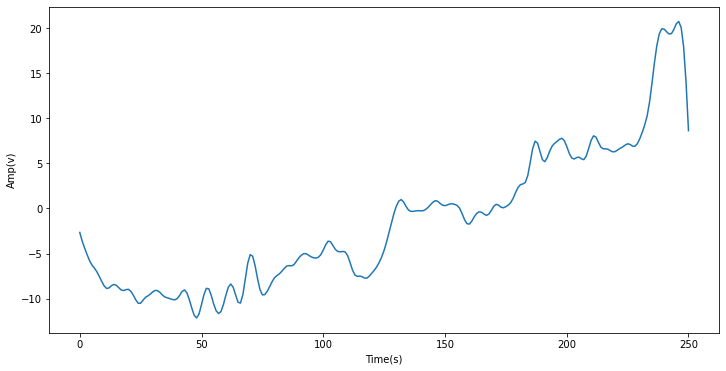

In [88]:
for i in filtered_signal:
    
    plt.figure(figsize=(12,6))
    plt.plot(np.arange(0,len(i)),i)
    plt.xlabel("Time(s)")
    plt.ylabel("Amp(v)")

# Resampling

In [186]:
resampled_Signal = []
for i in filtered_signal:
    re_Sgnl = signal.resample(i,60)
    resampled_Signal.append(re_Sgnl)

C:\Users\EGYPT\AppData\Local\Temp/ipykernel_19100/917735618.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,6))


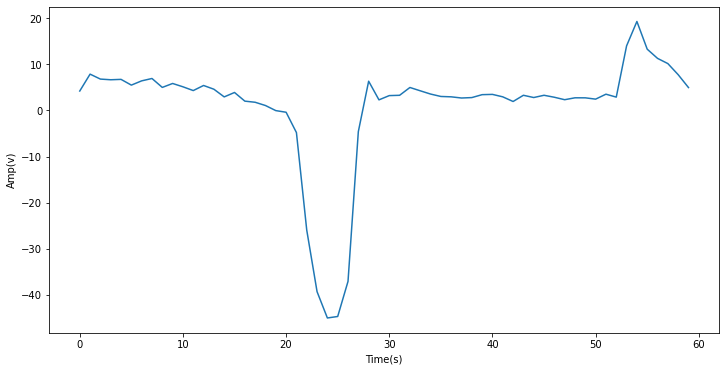

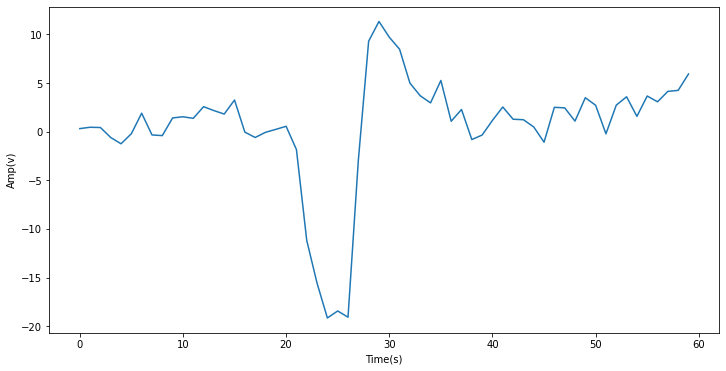

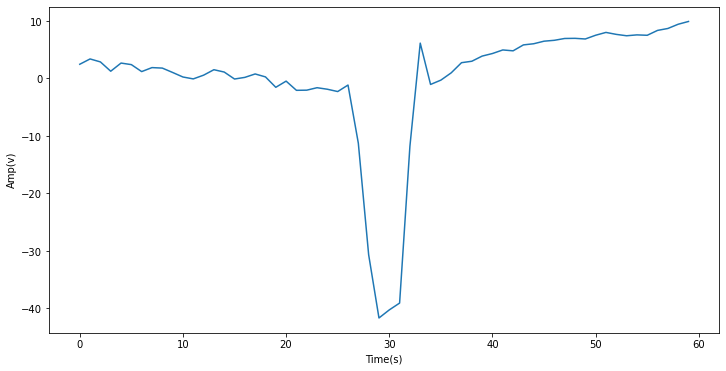

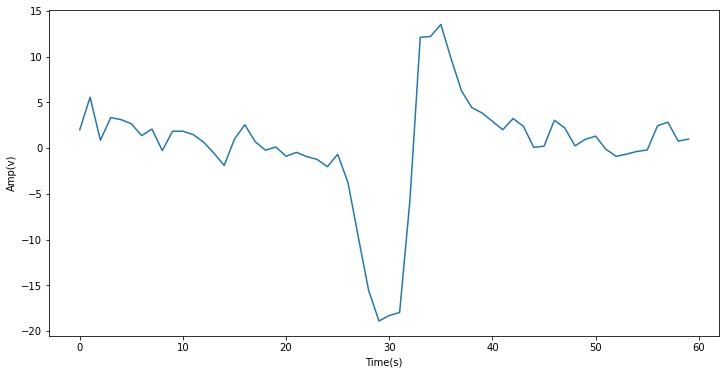

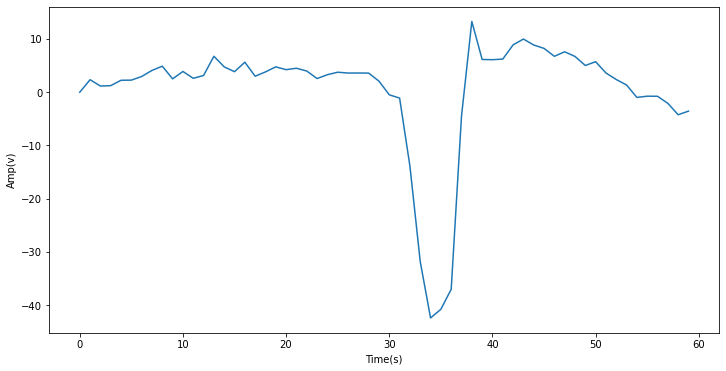

...

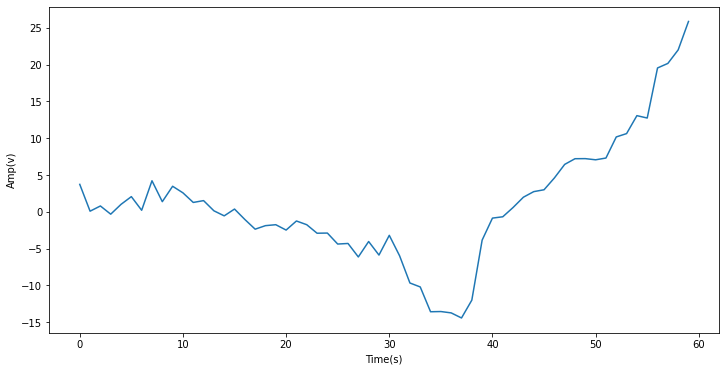

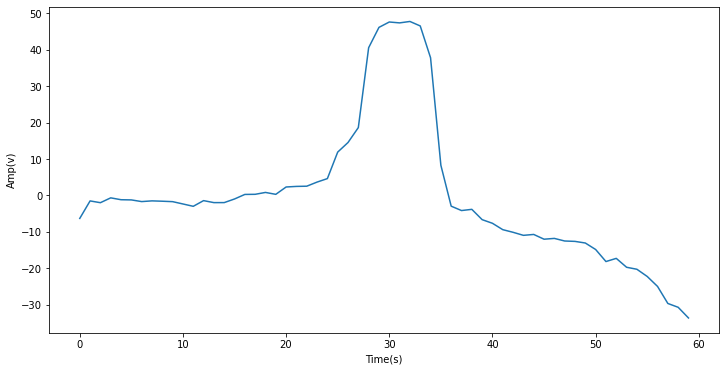

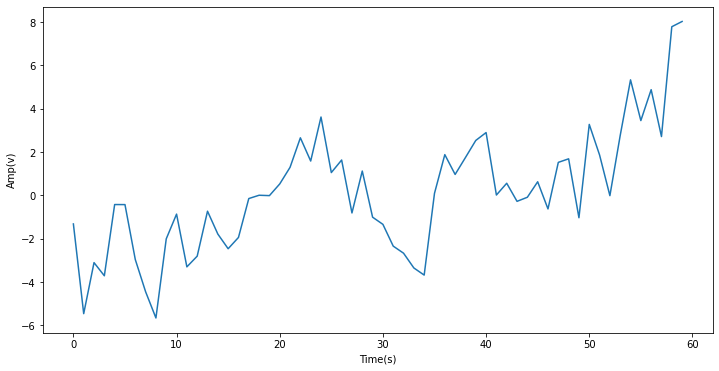

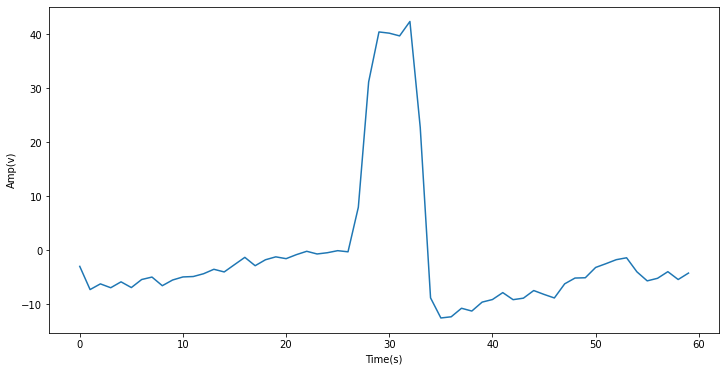

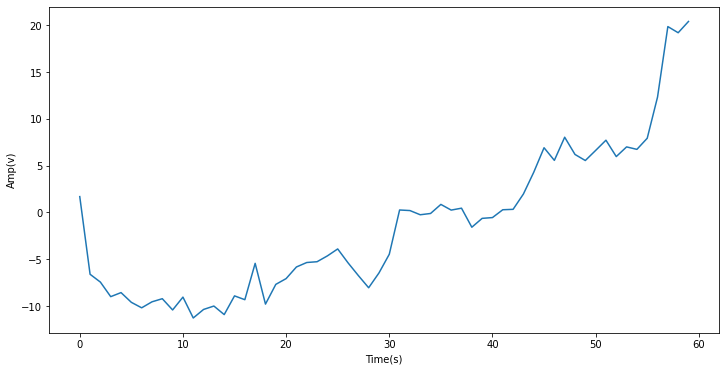

In [187]:
for i in resampled_Signal:
    plt.figure(figsize=(12,6))
    plt.plot(np.arange(0,len(i)),i)
    plt.xlabel("Time(s)")
    plt.ylabel("Amp(v)")

In [188]:
len(resampled_Signal)

201

In [189]:
len(filtered_signal)

201

In [190]:
resampled_Signal

[array([ 4.21595168e+00,  7.87942041e+00,  6.80548034e+00,  6.65934871e+00,
         6.74281584e+00,  5.49787068e+00,  6.42147886e+00,  6.93419894e+00,
         4.99748730e+00,  5.85288897e+00,  5.13191088e+00,  4.31295483e+00,
         5.41636728e+00,  4.60603004e+00,  2.93832180e+00,  3.89832169e+00,
         2.01830024e+00,  1.77348198e+00,  1.06640388e+00, -3.71055542e-02,
        -3.92231129e-01, -4.80277135e+00, -2.59774546e+01, -3.93425218e+01,
        -4.50505311e+01, -4.47275702e+01, -3.71089809e+01, -4.60051567e+00,
         6.34431293e+00,  2.29732657e+00,  3.22059735e+00,  3.28600539e+00,
         4.98348491e+00,  4.26405788e+00,  3.55744096e+00,  3.03275434e+00,
         2.95333770e+00,  2.69766448e+00,  2.79073344e+00,  3.42478034e+00,
         3.48200748e+00,  2.95176542e+00,  1.94034273e+00,  3.29122755e+00,
         2.80084756e+00,  3.29136914e+00,  2.86209485e+00,  2.32904630e+00,
         2.74225207e+00,  2.73595471e+00,  2.45346380e+00,  3.52665910e+00,
         2.8

# Remove DC component 

In [191]:
Mean=[np.mean(resampled_Signal[i]) for i in range(len(resampled_Signal))]
Mean

[0.8683808167853008,
 0.5064289135091282,
 -0.07947665779809601,
 0.29420862609828347,
 0.3557926977056368,
 0.4310195928851053,
 -0.6347522150976762,
 -1.0193928180018377,
 0.8496285132414257,
 0.03341903042828701,
 -0.73507348793586,
 0.572006414496109,
 0.05497680794178109,
 -0.07877708135018416,
 0.3228793208105701,
 -0.11198538578271985,
 -0.6983933023286021,
 0.29661509684604576,
 -0.4195110333172645,
 -1.0054360408721643,
 0.2092957371998868,
 0.54560825861774,
 -0.11269489133679682,
 0.4886348524620212,
 0.801293856470028,
 1.1164973982367643,
 1.121927689212408,
 -0.8443699629921236,
 -1.139392499844335,
 -1.5662526487435522,
 -0.10851645473111565,
 1.1308105598819898,
 0.02183418488174514,
 -1.7542845699141263,
 -1.0312552721253319,
 -0.6775716231003145,
 0.12402595857584792,
 0.34304499908697583,
 -0.3737484191391283,
 -0.48675165400561216,
 -0.4990720778958349,
 -0.17494676639575027,
 0.4121261706062941,
 0.9052403563282915,
 0.5186659278455803,
 -0.8931428527673639,
 -0.89

In [192]:
RemovedDC_signal=[(resampled_Signal[i]-Mean[i]) for i in range (len(resampled_Signal))]
RemovedDC_signal

[array([  3.34757086,   7.0110396 ,   5.93709952,   5.7909679 ,
          5.87443503,   4.62948986,   5.55309805,   6.06581812,
          4.12910648,   4.98450816,   4.26353006,   3.44457401,
          4.54798646,   3.73764922,   2.06994099,   3.02994087,
          1.14991942,   0.90510117,   0.19802307,  -0.90548637,
         -1.26061195,  -5.67115217, -26.84583545, -40.21090259,
        -45.91891189, -45.59595101, -37.97736173,  -5.46889649,
          5.47593211,   1.42894575,   2.35221654,   2.41762458,
          4.11510409,   3.39567706,   2.68906014,   2.16437353,
          2.08495689,   1.82928367,   1.92235262,   2.55639953,
          2.61362667,   2.0833846 ,   1.07196192,   2.42284673,
          1.93246674,   2.42298832,   1.99371403,   1.46066548,
          1.87387126,   1.86757389,   1.58508298,   2.65827828,
          2.02336273,  13.14552088,  18.44465676,  12.4281755 ,
         10.43252087,   9.30108619,   6.89397839,   4.09762205]),
 array([ -0.1989779 ,  -0.05981811,  -

# Test 

In [193]:
0.81301868 - 0.5064289135091282 <= 3.06589771e-01

True

In [194]:
re_test = np.array([  0.81301868,   0.3601039 ,   0.14513977,  -1.17577473,
         -0.53823931,   1.72442962,  -0.60401088,   0.33486902,
          1.71167779,   1.25454563,   2.57321225,   1.86504724,
          2.5812059 ,   1.70716615,  -1.13824244,   0.32223292,
         -0.07353863,   0.65695246,  -7.3249384 , -15.43074028,
        -18.35932599, -19.59094499, -14.06889241,   6.24185983,
         10.97320533,  10.21512092,   7.38316006,   4.56208819,
          2.82634885,   4.80054616,   1.77125203,   1.51904352,
         -1.0693733 ,   0.65598611,   2.22183091,   1.51880745,
          1.08748526,  -0.30976738,   0.51166342,   3.32713396,
          0.62802419,   4.2768596 ,   0.68011562,   1.53513805,
          3.44766086,   2.14254846,   3.21678154,   3.68829449,
          3.97226225,   5.75241604])
re_mean_test = 0.5064289135091282

In [195]:
re_test - re_mean_test 

array([ 3.06589766e-01, -1.46325014e-01, -3.61289144e-01, -1.68220364e+00,
       -1.04466822e+00,  1.21800071e+00, -1.11043979e+00, -1.71559894e-01,
        1.20524888e+00,  7.48116716e-01,  2.06678334e+00,  1.35861833e+00,
        2.07477699e+00,  1.20073724e+00, -1.64467135e+00, -1.84195994e-01,
       -5.79967544e-01,  1.50523546e-01, -7.83136731e+00, -1.59371692e+01,
       -1.88657549e+01, -2.00973739e+01, -1.45753213e+01,  5.73543092e+00,
        1.04667764e+01,  9.70869201e+00,  6.87673115e+00,  4.05565928e+00,
        2.31991994e+00,  4.29411725e+00,  1.26482312e+00,  1.01261461e+00,
       -1.57580221e+00,  1.49557196e-01,  1.71540200e+00,  1.01237854e+00,
        5.81056346e-01, -8.16196294e-01,  5.23450649e-03,  2.82070505e+00,
        1.21595276e-01,  3.77043069e+00,  1.73686706e-01,  1.02870914e+00,
        2.94123195e+00,  1.63611955e+00,  2.71035263e+00,  3.18186558e+00,
        3.46583334e+00,  5.24598713e+00])

In [196]:
resampled_Signal

[array([ 4.21595168e+00,  7.87942041e+00,  6.80548034e+00,  6.65934871e+00,
         6.74281584e+00,  5.49787068e+00,  6.42147886e+00,  6.93419894e+00,
         4.99748730e+00,  5.85288897e+00,  5.13191088e+00,  4.31295483e+00,
         5.41636728e+00,  4.60603004e+00,  2.93832180e+00,  3.89832169e+00,
         2.01830024e+00,  1.77348198e+00,  1.06640388e+00, -3.71055542e-02,
        -3.92231129e-01, -4.80277135e+00, -2.59774546e+01, -3.93425218e+01,
        -4.50505311e+01, -4.47275702e+01, -3.71089809e+01, -4.60051567e+00,
         6.34431293e+00,  2.29732657e+00,  3.22059735e+00,  3.28600539e+00,
         4.98348491e+00,  4.26405788e+00,  3.55744096e+00,  3.03275434e+00,
         2.95333770e+00,  2.69766448e+00,  2.79073344e+00,  3.42478034e+00,
         3.48200748e+00,  2.95176542e+00,  1.94034273e+00,  3.29122755e+00,
         2.80084756e+00,  3.29136914e+00,  2.86209485e+00,  2.32904630e+00,
         2.74225207e+00,  2.73595471e+00,  2.45346380e+00,  3.52665910e+00,
         2.8

# Visualization on DC component

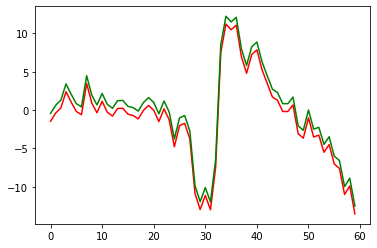

In [197]:
plt.plot(np.arange(0,len(resampled_Signal[7])), resampled_Signal[7], "red")
plt.plot(np.arange(0,len(RemovedDC_signal[7])), RemovedDC_signal[7], "green")

## Discrete Wavelet Transform

In [206]:
coeffs = wavedec(RemovedDC_signal , 'db1', level = 2)
coeffs

[array([[ 11.04333894,  11.06142053,   8.41085936, ...,   3.99240321,
          23.02085793,  15.36260376],
        [ -0.72850558,  -0.97278763,   0.92879772, ...,   2.50868187,
           4.75069303,   7.66544122],
        [  5.15703749,   4.23990161,   1.66946502, ...,  14.83963799,
          15.2449616 ,  18.35039521],
        ...,
        [ -7.0394071 ,  -4.37263898,  -6.1577795 , ...,   2.65255869,
           5.52317408,  11.45509866],
        [-10.1099725 ,  -9.96399402,  -9.33285825, ...,  -6.34671387,
          -4.79588086,  -7.79723163],
        [ -7.90645434, -16.17823973, -17.20150055, ...,  15.7999837 ,
          16.5746092 ,  38.63832844]]),
 array([[-6.84728480e-01, -5.57495640e-01,  7.02755282e-01, ...,
         -2.50958059e-01, -7.85197433e+00,  4.37100331e+00],
        [ 4.69709568e-01, -1.50824663e+00, -9.46420081e-01, ...,
          1.03996285e+00,  5.35520703e-01, -1.48256836e+00],
        [ 8.62996051e-01,  1.00016819e+00,  1.33454530e+00, ...,
         -8.39871677

In [209]:
res = pywt.waverec([coeffs[0],coeffs[1]],'db1') 
res

array([[  7.3246437 ,   8.292996  ,   7.42739652, ...,  21.83038905,
         13.95376737,   7.77223521],
       [ -0.18299642,  -0.84726606,  -1.75435615, ...,   2.98057693,
          4.37195133,   6.46861961],
       [  4.25680654,   3.03634582,   3.70528889, ...,  10.77798412,
         12.1658351 ,  13.78554268],
       ...,
       [ -4.96446535,  -4.99075963,  -0.77296065, ...,   6.03743382,
          5.19534653,  11.00460935],
       [ -6.12366989,  -8.17399034,  -7.88434666, ...,  -5.69623283,
         -5.34251372,  -5.684437  ],
       [ -1.51789386,  -9.66352111, -10.88511215, ...,  12.31833964,
         24.70000047,  29.94284764]])

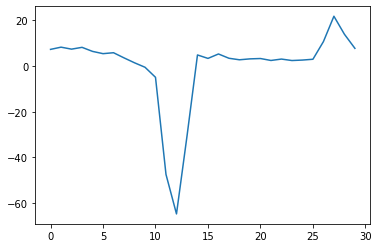

In [210]:
plt.plot(np.arange(0,len(res[0])), res[0])

# Classifcation

# Train Test Split

In [411]:
X_train, X_test, y_train, y_test = train_test_split(res, y, test_size=0.20, random_state=40,stratify = y)

In [412]:
scaler = MinMaxScaler()

In [413]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [414]:
print(X_train.shape)
print(X_test.shape)

(160, 30)
(41, 30)


In [415]:
y.value_counts()

251
5      41
1      40
2      40
3      40
4      40
dtype: int64

In [416]:
y_train.value_counts()

251
1      32
2      32
3      32
4      32
5      32
dtype: int64

# XGBoost Classifier

In [417]:
#pip install xgboost

In [418]:
from xgboost import XGBClassifier

In [419]:
xgb = XGBClassifier( learning_rate=0.3, max_depth=4)

# Naive Bayes Algorthim

# Best Model

In [420]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(X_train, y_train)

C:\Users\EGYPT\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


GaussianNB()

In [421]:
nb.predict(X_test)

array([1, 5, 2, 2, 5, 3, 5, 4, 1, 2, 5, 5, 1, 5, 2, 2, 5, 1, 4, 5, 5, 1,
       3, 1, 4, 3, 5, 2, 2, 4, 1, 2, 5, 3, 2, 5, 5, 4, 1, 5, 5],
      dtype=int64)

In [422]:
nb.score(X_train,y_train)

0.60625

In [423]:
nb.score(X_test,y_test)

0.5853658536585366

In [424]:
error = abs(round(nb.score(X_test, y_test) - nb.score(X_train, y_train), 2))
error

0.02

In [425]:
 ytest_pred_nb = nb.predict(X_test)

In [426]:
ytrain_pred_nb = nb.predict(X_train)

In [427]:
metrics.accuracy_score(y_test,ytest_pred_nb)

0.5853658536585366

In [428]:
conf_mat_nb =confusion_matrix(y_test,ytest_pred_nb)
conf_mat_nb

array([[3, 1, 0, 0, 4],
       [1, 5, 0, 1, 1],
       [1, 1, 4, 0, 2],
       [2, 2, 0, 4, 0],
       [1, 0, 0, 0, 8]], dtype=int64)

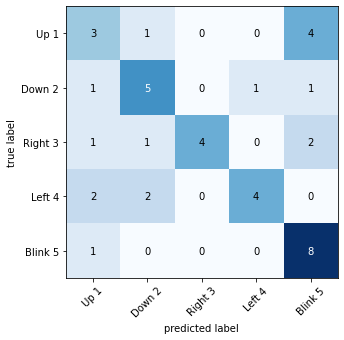

In [429]:
plot_confusion_matrix(conf_mat_nb,class_names=["Up 1","Down 2","Right 3","Left 4", "Blink 5"],figsize=(12,5)); #fn

# KNN Algorthim

In [430]:
from sklearn.neighbors import KNeighborsClassifier

In [431]:
knn = KNeighborsClassifier()

In [432]:
knn.fit(X_train, y_train)

C:\Users\EGYPT\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier()

In [433]:
ytrain_pred_knn = knn.predict(X_train)

In [434]:
ytest_pred_knn = knn.predict(X_test)

In [435]:
knn_train_score = knn.score(X_train,y_train)
knn_train_score

0.6875

In [436]:
knn_test_score = knn.score(X_test,y_test)
knn_test_score

0.5121951219512195

In [437]:
error = abs(round(knn_test_score - knn_train_score, 2))
error

0.18

In [438]:
metrics.accuracy_score(y_test,ytest_pred_knn)

0.5121951219512195

In [439]:
metrics.confusion_matrix (y_test,ytest_pred_knn)

array([[3, 0, 1, 1, 3],
       [0, 4, 1, 1, 2],
       [1, 1, 5, 0, 1],
       [1, 3, 0, 4, 0],
       [3, 0, 1, 0, 5]], dtype=int64)

In [440]:
conf_mat_knn =confusion_matrix(y_test,ytest_pred_knn)
conf_mat_knn

array([[3, 0, 1, 1, 3],
       [0, 4, 1, 1, 2],
       [1, 1, 5, 0, 1],
       [1, 3, 0, 4, 0],
       [3, 0, 1, 0, 5]], dtype=int64)

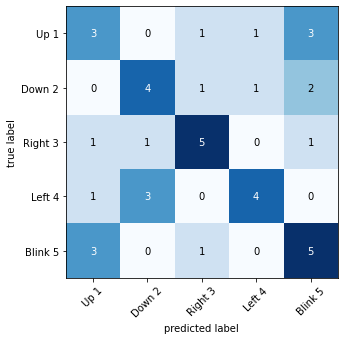

In [441]:
plot_confusion_matrix(conf_mat_knn,class_names=["Up 1","Down 2","Right 3","Left 4", "Blink 5"],figsize=(12,5)); #fn

# LogisticRegression Model

# Worest Model

In [442]:
from sklearn.linear_model import LogisticRegression

In [443]:
log = LogisticRegression(max_iter=1000,C=0.2)

In [444]:
log.fit(X_train,y_train)

C:\Users\EGYPT\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


LogisticRegression(C=0.2, max_iter=1000)

In [445]:
log.score(X_train,y_train)

0.5125

In [446]:
log.score(X_test , y_test)

0.4634146341463415

In [447]:
error = abs(round(log.score(X_test, y_test) - log.score(X_train, y_train), 2))
error

0.05

In [448]:
ytest_pred_log = log.predict(X_test)

In [449]:
ytrain_pred_log = log.predict(X_train)

In [450]:
metrics.accuracy_score(y_test,ytest_pred_log)

0.4634146341463415

In [451]:
conf_mat_log =confusion_matrix(y_test,ytest_pred_log)
conf_mat_log

array([[3, 1, 0, 2, 2],
       [3, 3, 0, 2, 0],
       [0, 3, 4, 0, 1],
       [0, 3, 0, 5, 0],
       [3, 1, 1, 0, 4]], dtype=int64)

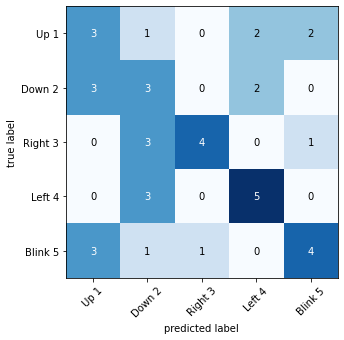

In [452]:
plot_confusion_matrix(conf_mat_log,class_names=["Up 1","Down 2","Right 3","Left 4", "Blink 5"],figsize=(12,5)); #fn